In [1]:
import pandas as pd
from sklearn.preprocessing import normalize 
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import cosine_similarity
from datetime import datetime
from tqdm import tqdm_notebook
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline 

In [2]:
df_ = pd.read_csv('data/votos.csv.gz', compression='gzip')
df_.shape[0]

16992733

In [3]:
df_.head()

,Unnamed: 0,cod_prop,num_prop,tipo,codSessao,data_hora,nome_dep,partido,uf,voto
0,0,167035,63,PDC,2081,17:05 7/11/1991,Alceste Almeida,PTB,RR,Não
1,1,167035,63,PDC,2081,17:05 7/11/1991,Júlio Cabral,PTR,RR,Abstenção
2,2,167035,63,PDC,2081,17:05 7/11/1991,João Fagundes,PMDB,RR,Sim
3,3,167035,63,PDC,2081,17:05 7/11/1991,Marcelo Luz,PTR,RR,Sim
4,4,167035,63,PDC,2081,17:05 7/11/1991,Gilvan Borges,PMDB,AP,Não


In [4]:
df_.groupby('voto').count()['Unnamed: 0']

voto
Abstenção     178375
Art. 17        29466
Branco             2
Não          7795935
Obstrução     534760
Sim          8454195
Name: Unnamed: 0, dtype: int64

In [5]:
df = df_[df_['voto'].str.contains('Não|Sim')]
#df = df_[df_['voto'].str.contains('Não|Sim|Obstrução|Abstenção')]
df.groupby('voto').count()['Unnamed: 0']

voto
Não    7795935
Sim    8454195
Name: Unnamed: 0, dtype: int64

In [6]:
df.shape[0]

16250130

In [7]:
df['data_hora_f'] = pd.to_datetime(df['data_hora'], format='%H:%M %d/%m/%Y')
df['id'] = df['cod_prop'].map(str) + '_' + df['num_prop'].map(str) + '_' + df['codSessao'].map(str) + '_' + df['data_hora_f'].map(str)
df = df.drop('data_hora', axis=1)
df = df.drop('Unnamed: 0', axis=1)
df.head()

/home/mangaravite/.local/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/home/mangaravite/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,cod_prop,num_prop,tipo,codSessao,nome_dep,partido,uf,voto,data_hora_f,id
0,167035,63,PDC,2081,Alceste Almeida,PTB,RR,Não,1991-11-07 17:05:00,167035_63_2081_1991-11-07 17:05:00
2,167035,63,PDC,2081,João Fagundes,PMDB,RR,Sim,1991-11-07 17:05:00,167035_63_2081_1991-11-07 17:05:00
3,167035,63,PDC,2081,Marcelo Luz,PTR,RR,Sim,1991-11-07 17:05:00,167035_63_2081_1991-11-07 17:05:00
4,167035,63,PDC,2081,Gilvan Borges,PMDB,AP,Não,1991-11-07 17:05:00,167035_63_2081_1991-11-07 17:05:00
5,167035,63,PDC,2081,Murilo Pinheiro,PFL,AP,Sim,1991-11-07 17:05:00,167035_63_2081_1991-11-07 17:05:00


In [8]:
df = df[['id','nome_dep','partido','uf','voto', 'data_hora_f']]
df = df.set_index('data_hora_f')
df.head()

,id,nome_dep,partido,uf,voto
data_hora_f,,,,,
1991-11-07 17:05:00,167035_63_2081_1991-11-07 17:05:00,Alceste Almeida,PTB,RR,Não
1991-11-07 17:05:00,167035_63_2081_1991-11-07 17:05:00,João Fagundes,PMDB,RR,Sim
1991-11-07 17:05:00,167035_63_2081_1991-11-07 17:05:00,Marcelo Luz,PTR,RR,Sim
1991-11-07 17:05:00,167035_63_2081_1991-11-07 17:05:00,Gilvan Borges,PMDB,AP,Não
1991-11-07 17:05:00,167035_63_2081_1991-11-07 17:05:00,Murilo Pinheiro,PFL,AP,Sim


In [9]:
class LimitedQueue():
    def __init__(self, k=2):
        self.k = k
        self.array = []
    def add(self, value):
        self.array.append(value)
        if len(self.array) > self.k:
            self.array.pop(0)
    def __len__(self):
        return len(self.array)

In [149]:
def def_trimonth(m):
    if m < 4:
        return 1
    if 3 < m < 7:
        return 4
    if 6 < m < 10:
        return 7
    return 10

In [150]:
counting = 0

k = 1
history_partido = LimitedQueue(k)
history_deputad = LimitedQueue(k)

all_df = pd.DataFrame()

years = df.index.year.astype(int)
semes = [ def_trimonth(m) for m in df.index.month.astype(int) ]

#grouped_by = df.groupby( pd.Grouper(freq='M') )
grouped_by = df.groupby([years, semes])
for month_date, group in tqdm_notebook(grouped_by, total=len(grouped_by)):
    group_partido = group.drop('nome_dep', axis=1)
    group_pivot_partido = group_partido.pivot_table(columns=['id', 'voto'],index='partido', aggfunc='count').fillna(0)
    
    # merge the history
    history_partido.add( group_pivot_partido )
    for h_partido in history_partido.array:
        group_pivot_partido = pd.merge(group_pivot_partido, h_partido, how='outer', on='partido').fillna(0)
        
    if group_pivot_partido.shape[0] == 0:
        continue
    
    sim = cosine_similarity(group_pivot_partido.values)
    df_sim_partido = pd.DataFrame( sim, columns=group_pivot_partido.reset_index()['partido'] )
    df_sim_partido['nome'] = group_pivot_partido.reset_index()['partido']
    df_sim_partido['partido'] = df_sim_partido['nome']
    df_sim_partido['tipo'] = 'partido'
    #df_sim_partido['data'] = month_date
    df_sim_partido['data'] = datetime(year=month_date[0], month=month_date[1], day=1)
    df_sim_partido.reset_index(inplace=True)
    df_sim_partido.drop('index', axis=1, inplace=True)
    df_sim_partido.set_index(['nome', 'partido', 'tipo', 'data'], inplace=True)
    
    group_pivot_dep = group.pivot_table(columns=['id', 'voto'],index=['nome_dep','partido'], aggfunc='count').fillna(0)
    
    # merge the history
    history_deputad.add( group_pivot_dep )
    for h_deputado in history_deputad.array:
        group_pivot_dep = pd.merge(group_pivot_dep, h_deputado, how='outer', on=['nome_dep', 'partido']).fillna(0)
    
    sim = cosine_similarity(X=group_pivot_dep.values, Y=group_pivot_partido.values)
    df_sim_dep = pd.DataFrame( sim, columns=group_pivot_partido.reset_index()['partido'] )
    df_sim_dep['nome'] = group_pivot_dep.reset_index()['nome_dep']
    df_sim_dep['partido'] = group_pivot_dep.reset_index()['partido']
    df_sim_dep['tipo'] = 'deputado'
    df_sim_dep['data'] = datetime(year=month_date[0], month=month_date[1], day=1)
    #df_sim_dep['data'] = month_date
    df_sim_dep.reset_index(inplace=True)
    df_sim_dep.drop('index', axis=1, inplace=True)
    df_sim_dep.set_index(['nome', 'partido', 'tipo', 'data'], inplace=True)
    
    counting += 1
    
    df_sim = pd.concat([df_sim_dep, df_sim_partido], sort=False)
    df_sim.fillna(0, inplace=True)
    for col in df_sim.columns:
        df_sim[col] = (df_sim[col]-df_sim[col].mean())/df_sim[col].std()
    
    all_df = pd.concat([all_df, df_sim], sort=False)
all_df.fillna(0, inplace=True)

In [151]:
all_df.shape

(61989, 57)

In [152]:
all_df.tail()

,,,,PCB,PCdoB,PDC,PDS,PDT,PFL,PL,PMDB,PMN,PP,...,REDE,PMB,PODE,Avante,Podemos,MDB,Patriota,DC,NOVO,CIDADANIA
nome,partido,tipo,data,,,,,,,,,,,,,,,,,,,,,
Patriota,Patriota,partido,2019-07-01,0.0,-0.711935,0.0,0.0,-0.694189,0.0,0.785728,0.0,-0.217365,0.797014,...,-0.704251,0.0,0.0,0.795786,0.833831,0.816481,0.927072,0.0,0.925410,0.777656
Podemos,Podemos,partido,2019-07-01,0.0,-0.384643,0.0,0.0,-0.288822,0.0,0.885088,0.0,0.105979,0.859405,...,-0.389202,0.0,0.0,0.981042,0.946098,0.864783,0.826989,0.0,0.726271,0.907847
REDE,REDE,partido,2019-07-01,0.0,1.459425,0.0,0.0,1.737659,0.0,-1.589151,0.0,0.236183,-1.555299,...,2.455286,0.0,0.0,-1.348183,-1.580858,-1.580625,-1.575137,0.0,-1.589823,-1.510378
S.Part.,S.Part.,partido,2019-07-01,0.0,-0.648421,0.0,0.0,-0.642020,0.0,0.731462,0.0,0.106461,0.750248,...,-0.662477,0.0,0.0,0.699148,0.744987,0.775996,0.830008,0.0,0.810734,0.721668
Solidaried,Solidaried,partido,2019-07-01,0.0,-0.316812,0.0,0.0,-0.209949,0.0,0.878198,0.0,0.601505,0.873583,...,-0.306838,0.0,0.0,0.940115,0.860718,0.864078,0.826715,0.0,0.769379,0.978748


In [153]:
all_df.head()

,,,,PCB,PCdoB,PDC,PDS,PDT,PFL,PL,PMDB,PMN,PP,...,REDE,PMB,PODE,Avante,Podemos,MDB,Patriota,DC,NOVO,CIDADANIA
nome,partido,tipo,data,,,,,,,,,,,,,,,,,,,,,
Adauto Pereira,PFL,deputado,1991-04-01,-0.778662,-0.739445,0.088735,0.749424,-0.768592,0.677303,0.000381,1.017130,0.971981,-0.178933,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Adelaide Neri,PMDB,deputado,1991-04-01,-0.026096,-0.034062,0.641729,0.842354,-0.083929,1.011721,0.567049,1.992113,0.957856,0.764164,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Adroaldo Streck,PSDB,deputado,1991-04-01,1.482453,1.701264,-0.257984,-0.870727,1.632947,-0.719269,-0.092585,-0.378346,-0.931412,-0.402005,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Adylson Motta,PDS,deputado,1991-04-01,-0.506089,-0.805318,1.123717,1.452593,-0.461265,1.296636,0.883674,1.280494,1.335709,1.007115,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Adão Pretto,PT,deputado,1991-04-01,1.123686,1.325257,-1.367150,-0.779533,1.066781,-0.886267,-1.593917,0.188213,-0.481430,-1.188514,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [154]:
X = all_df.values

In [155]:
pca = PCA(n_components=2)
y = pca.fit_transform(X)
y = normalize(y, 'l2', axis=0)

In [156]:
y.shape

(61989, 2)

In [157]:
modelagem = pd.DataFrame(y, columns=['x','y'])
modelagem['nome'] = all_df.reset_index()['nome']
modelagem['partido'] = all_df.reset_index()['partido']
modelagem['tipo'] = all_df.reset_index()['tipo']
modelagem['data'] = all_df.reset_index()['data']
max_x = max(abs(modelagem['x']))
max_y = max(abs(modelagem['y']))
modelagem.set_index('data', inplace=True)
modelagem['x'] = modelagem['x']/max_x
modelagem['y'] = modelagem['y']/max_y
modelagem.head()

,x,y,nome,partido,tipo
data,,,,,
1991-04-01,0.002482,-0.134975,Adauto Pereira,PFL,deputado
1991-04-01,-0.088539,-0.191242,Adelaide Neri,PMDB,deputado
1991-04-01,-0.051334,0.301228,Adroaldo Streck,PSDB,deputado
1991-04-01,-0.068568,-0.336429,Adylson Motta,PDS,deputado
1991-04-01,0.000969,0.484394,Adão Pretto,PT,deputado


In [158]:
modelagem_partidos = modelagem[modelagem['tipo'] == 'partido']
modelagem_partidos.head()

,x,y,nome,partido,tipo
data,,,,,
1991-04-01,-0.009650,0.510935,PCB,PCB,partido
1991-04-01,-0.009414,0.523107,PCdoB,PCdoB,partido
1991-04-01,-0.142992,-0.457275,PDC,PDC,partido
1991-04-01,-0.104971,-0.467261,PDS,PDS,partido
1991-04-01,-0.044308,0.437457,PDT,PDT,partido


In [159]:
from matplotlib.pyplot import get_cmap 

In [160]:
colors = { p:get_cmap('tab20')(i) for i, p in enumerate(modelagem['partido'].unique()) }
def get_color(v):
    if v in colors:
        return colors[v]
    return 'gray'
from collections import Counter
colors_static = { 
                  'PMDB': 'green',
                  'MDB': 'darkgreen',
                  'PT': 'red',
                  'PSDB': 'blue',
                  'PFL': 'maroon',
                  'PP': 'k',
                  'PTB': 'darkcyan',
                  'PDT': 'sienna',
                  'PSB': 'crimson',
                  'NOVO': 'orangered',
                  'PSL': 'gold',
                  'PSOL': 'tomato'
                }
def get_color_static(v):
    if v in colors_static:
        return colors_static[v]
    return 'lightgray'

In [161]:
from collections import Counter

In [162]:
sorted( [ (p,v) for (p,v) in Counter(modelagem['partido']).items() ], key=lambda x: x[1], reverse=True )[:5]

[('PMDB', 9607), ('PT', 7519), ('PSDB', 7287), ('PFL', 5584), ('PP', 3553)]

In [163]:
import matplotlib.patches as mpatches

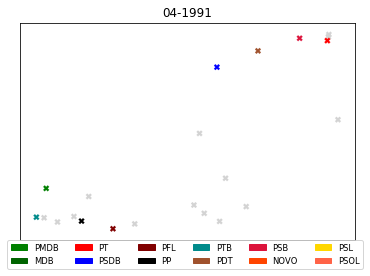

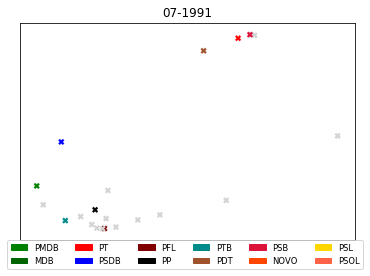

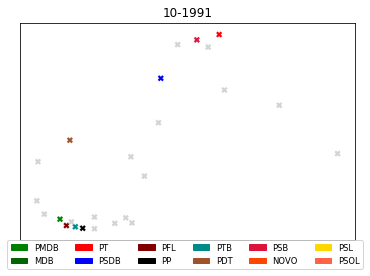

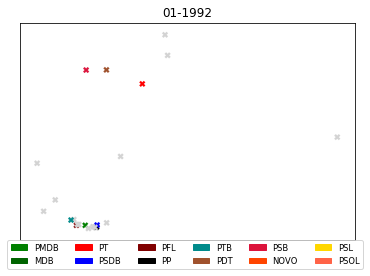

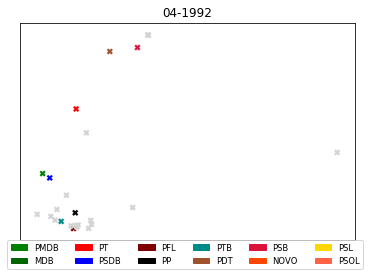

...

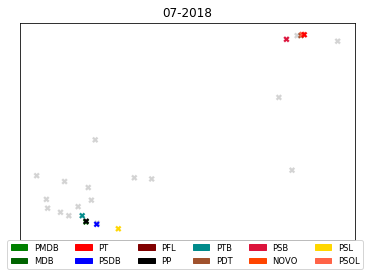

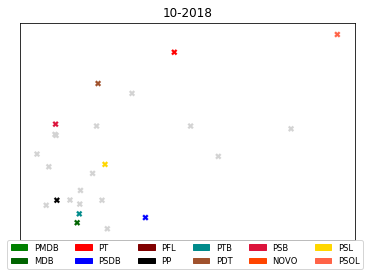

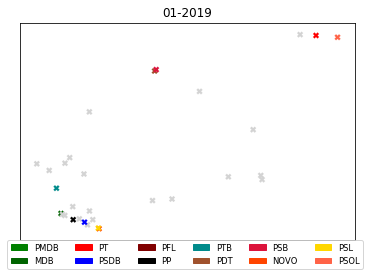

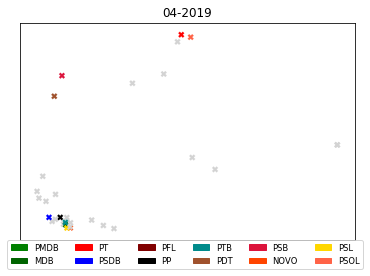

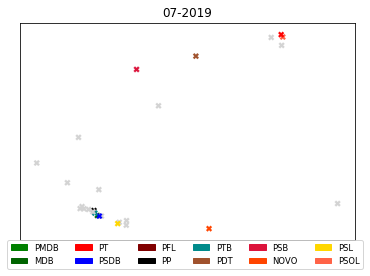

In [198]:
grouped_by = modelagem_partidos.groupby(pd.Grouper(freq='M') )
for i, (month_date, group) in tqdm_notebook(enumerate(grouped_by), total=len(grouped_by)):
    if group.shape[0] == 0:
        continue
    
    colors_to_use = [ get_color_static(p) for p in group['partido']  ]
    
    x = group['x']
    x = (x-x.mean())/x.std()
    x = x/max(abs(x))
    
    y = group['y']
    y = (y-y.mean())/y.std()
    y = y/max(abs(y))
    
    plt.scatter(x, y, marker='X', linewidths=0.1, c=colors_to_use)#, main=month_date.strftime('%m-%Y'), xticks=[], yticks=[])
    plt.title(month_date.strftime('%m-%Y'))
    plt.xticks([])
    plt.yticks([])
    patch = [ mpatches.Patch(color=c, label=p) for p,c in colors_static.items() ] 
    plt.legend(handles=patch, ncol=6, bbox_to_anchor=(-.05, -0.15), loc='lower left', fontsize='small')
    
    #pplot = group.plot.scatter( x='x', y='y', c=colors_to_use, title=month_date.strftime('%m-%Y'), xticks=[], yticks=[] )
    plt.savefig("figures/partidos/figure_%03d.png" % i)
    plt.show()

In [165]:
modelagem_deputado = modelagem[modelagem['tipo'] == 'deputado']
modelagem_deputado.head()

,x,y,nome,partido,tipo
data,,,,,
1991-04-01,0.002482,-0.134975,Adauto Pereira,PFL,deputado
1991-04-01,-0.088539,-0.191242,Adelaide Neri,PMDB,deputado
1991-04-01,-0.051334,0.301228,Adroaldo Streck,PSDB,deputado
1991-04-01,-0.068568,-0.336429,Adylson Motta,PDS,deputado
1991-04-01,0.000969,0.484394,Adão Pretto,PT,deputado


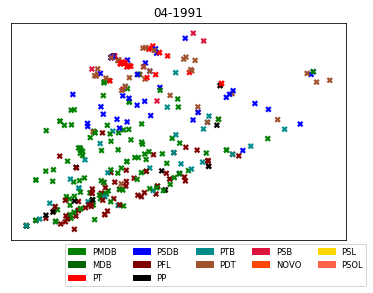

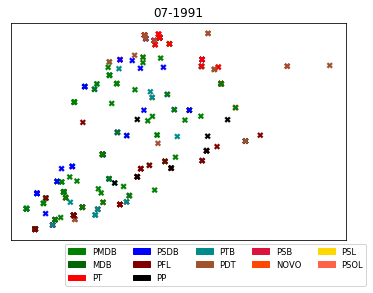

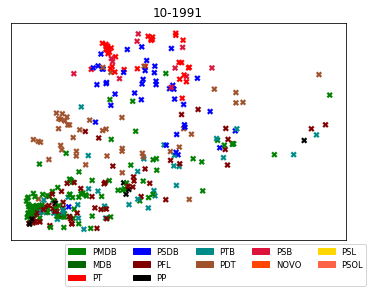

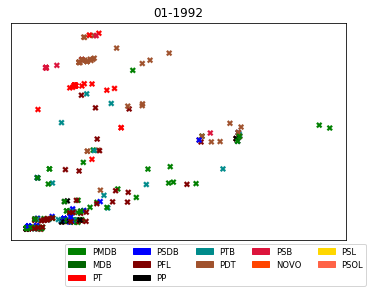

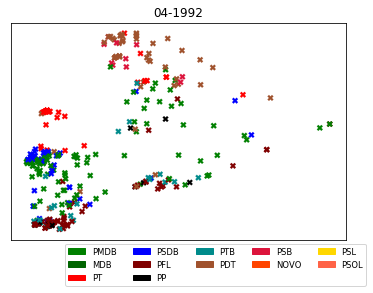

...

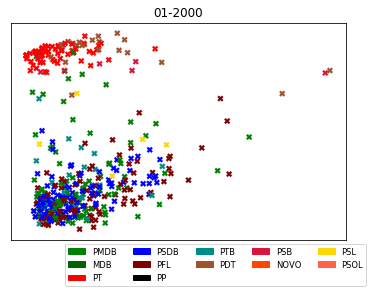

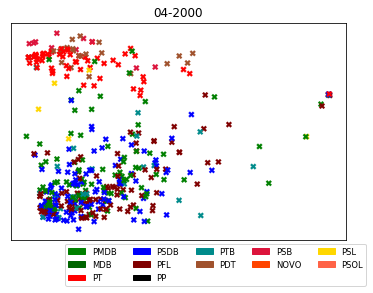

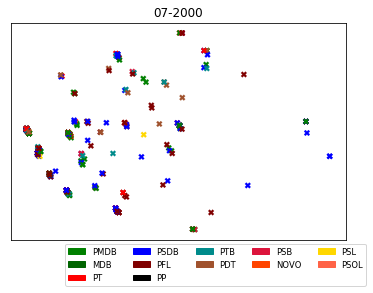

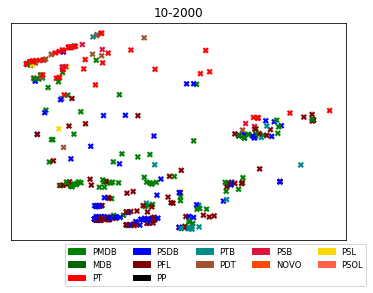

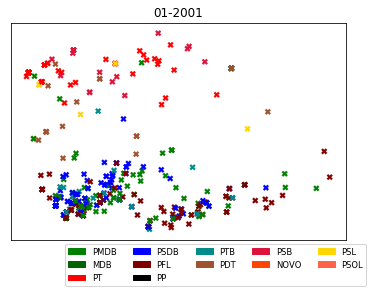

KeyboardInterrupt: 

In [187]:
grouped_by = modelagem_deputado.groupby(pd.Grouper(freq='M') )
for i, (month_date, group) in tqdm_notebook(enumerate(grouped_by), total=len(grouped_by)):
    if group.shape[0] == 0:
        continue
    group = group[[p in colors_static for p in group['partido']]]
    colors_to_use = [ get_color_static(p) for p in group['partido']  ]
    x = (group['x']-group['x'].mean())/group['x'].std()
    y = (group['y']-group['y'].mean())/group['y'].std()
    plt.scatter(x, y, marker='X', linewidths=0.1, c=colors_to_use)#, main=month_date.strftime('%m-%Y'), xticks=[], yticks=[])
    plt.title(month_date.strftime('%m-%Y'))
    plt.xticks([])
    plt.yticks([])
    patch = [ mpatches.Patch(color=c, label=p) for p,c in colors_static.items() ] 
    plt.legend(handles=patch, ncol=6, bbox_to_anchor=(-.05, -0.15), loc='lower left', fontsize='small')
    
    plt.savefig("figures/deputados/figure_%03d.png" % i)
    plt.show()
    #break

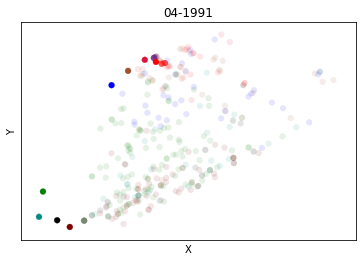

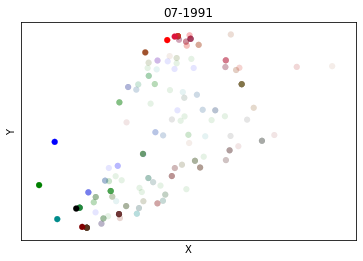

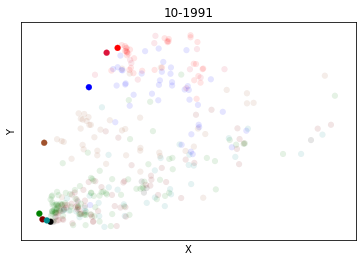

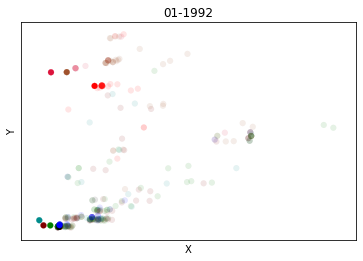

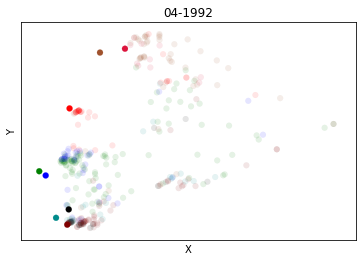

...

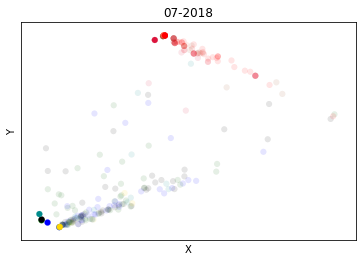

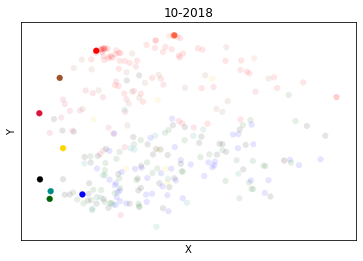

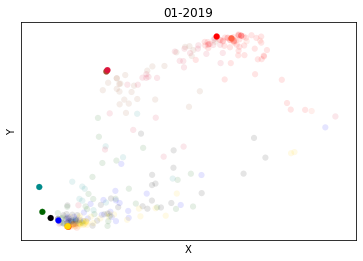

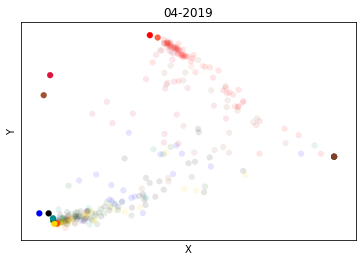

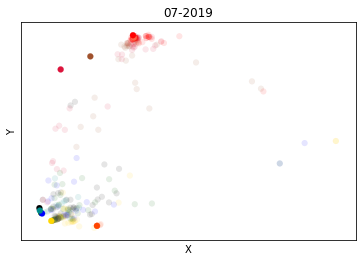

In [167]:
grouped_by = modelagem.groupby(pd.Grouper(freq='M') )
for i, (month_date, group) in tqdm_notebook(enumerate(grouped_by), total=len(grouped_by)):
    if group.shape[0] == 0:
        continue
    
    #group['x'] = (group['x']-group['x'].mean())/group['x'].std()
    #group['x'] = group['x']/max(abs(group['x']))
    
    #group['y'] = (group['y']-group['y'].mean())/group['y'].std()
    #group['y'] = group['y']/max(abs(group['y']))
    
    # plot deputados
    group_deputado = group[ [ t == 'deputado' for t in group['tipo']] ]
    group_deputado = group_deputado[ [p in colors_static for p in group_deputado['partido']] ]
    colors_to_use = [ get_color_static(p) for p in group_deputado['partido']  ]
    
    x = group_deputado['x']
    y = group_deputado['y']
    
    plt.scatter(x, y, linewidths=0.1, alpha=0.1, c=colors_to_use)#, main=month_date.strftime('%m-%Y'), xticks=[], yticks=[])
    
    plt.title(month_date.strftime('%m-%Y'))
    plt.xlabel('X')
    plt.xticks([])
    plt.ylabel('Y')
    plt.yticks([])
    
    # plot partidos
    group_partidos = group[ [ t == 'partido' for t in group['tipo']] ]
    group_partidos = group_partidos[ [p in colors_static for p in group_partidos['partido']] ]
    colors_to_use = [ get_color_static(p) for p in group_partidos['partido']  ]
    
    x = group_partidos['x']
    y = group_partidos['y']
    
    plt.scatter(x, y, linewidths=0.2, c=colors_to_use)#, main=month_date.strftime('%m-%Y'), xticks=[], yticks=[])
    
    plt.title(month_date.strftime('%m-%Y'))
    plt.xlabel('X')
    plt.xticks([])
    plt.ylabel('Y')
    plt.yticks([])
    
    
    plt.show()

In [90]:
import numpy as np

In [87]:
def znorm_max_min(x):
    x = (x-x.mean())/x.std()
    x = x/max(abs(x))
    return x

In [85]:
atual_df = pd.DataFrame()
atual_df['partido'] = group['partido']
atual_df['x'] = x
atual_df['y'] = y

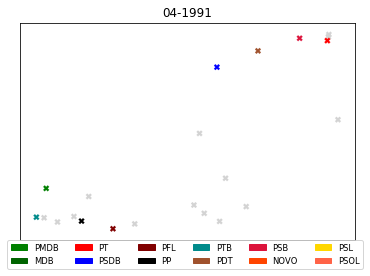

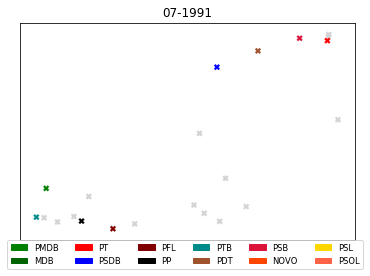

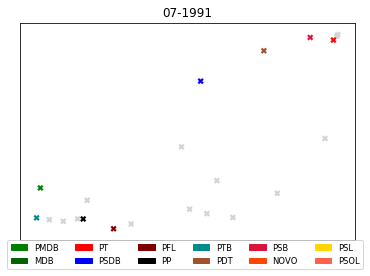

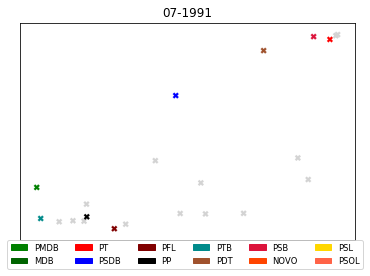

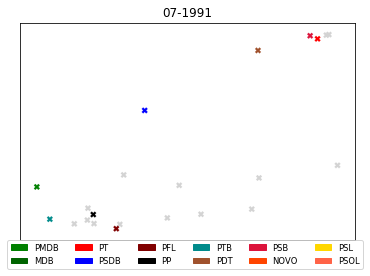

...

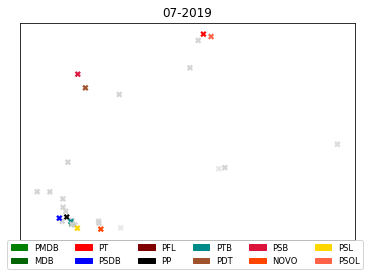

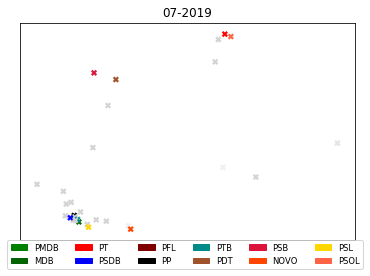

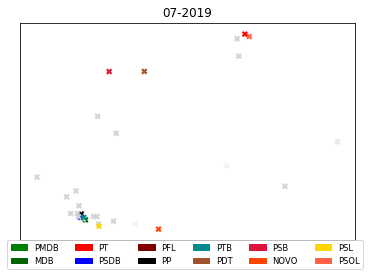

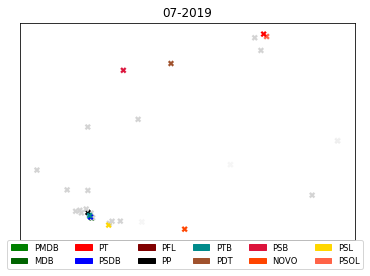

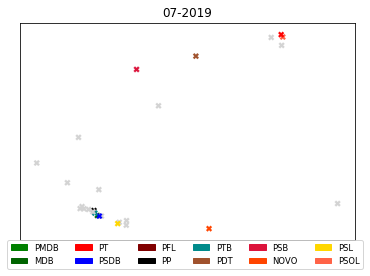

In [200]:
grouped_by = modelagem_partidos.groupby(pd.Grouper(freq='M') )
last_month = None
k = 5
i = 0
for month_date, group in tqdm_notebook(grouped_by, total=len(grouped_by)):
    if group.shape[0] == 0:
        continue
    
    x = znorm_max_min(group['x'])
    y = znorm_max_min(group['y'])
    
    atual_df = pd.DataFrame()
    atual_df['partido'] = group['partido']
    atual_df['x'] = x
    atual_df['y'] = y
    
    if last_month is not None:
        set_last_month  = set(last_month['partido'])
        set_atual_month = set(atual_df['partido'])
        
        new_party       = set_atual_month - set_last_month
        dont_exist_more = set_last_month  - set_atual_month
        intersection_df = (atual_df.set_index('partido') - last_month.set_index('partido')).dropna()
        intersection_df['x'] = intersection_df['x'] / k
        intersection_df['y'] = intersection_df['y'] / k
        
        for it in range(k):
            # Partido NOVO no trimestre
            if len(new_party):
                sub_group = atual_df[ [ p in new_party for p in atual_df['partido'] ] ]
                x = sub_group['x']
                y = sub_group['y']
                colors_to_use = [ get_color_static(p) for p in sub_group['partido']  ]
                plt.scatter(x, y, marker='X', alpha=1.-1./(1.+it), linewidths=0.1, c=colors_to_use)
            
            # Partido NÃO EXISTE MAIS no trimestre
            if len(dont_exist_more):
                sub_group = last_month[ [ p in dont_exist_more for p in last_month['partido'] ] ]
                x = sub_group['x']
                y = sub_group['y']
                colors_to_use = [ get_color_static(p) for p in sub_group['partido']  ]
                plt.scatter(x, y, marker='X', alpha=1./(1.+it), linewidths=0.1, c=colors_to_use)
            
            # Partidos que existem em ambos trimestres
            if len(intersection_df):
                sub_group = (last_month.set_index('partido') + it*intersection_df).dropna().reset_index()
                x = sub_group['x']
                y = sub_group['y']
                colors_to_use = [ get_color_static(p) for p in sub_group['partido']  ]
                plt.scatter(x, y, marker='X', linewidths=0.1, c=colors_to_use)
                
                
            
            plt.title(month_date.strftime('%m-%Y'))
            plt.xticks([])
            plt.yticks([])
            patch = [ mpatches.Patch(color=c, label=p) for p,c in colors_static.items() ] 
            plt.legend(handles=patch, ncol=6, bbox_to_anchor=(-.05, -0.15), loc='lower left', fontsize='small')
            
            plt.savefig("figures/partidos_iter/figure_%05d.png" % i)
            plt.show()
            i += 1
        
    
    x = atual_df['x']
    y = atual_df['y']
    colors_to_use = [ get_color_static(p) for p in group['partido']  ]
    plt.scatter(x, y, marker='X', linewidths=0.1, c=colors_to_use)
    plt.title(month_date.strftime('%m-%Y'))
    plt.xticks([])
    plt.yticks([])
    patch = [ mpatches.Patch(color=c, label=p) for p,c in colors_static.items() ] 
    plt.legend(handles=patch, ncol=6, bbox_to_anchor=(-.05, -0.15), loc='lower left', fontsize='small')
    
    last_month = atual_df
    
    plt.savefig("figures/partidos_iter/figure_%05d.png" % i)
    plt.show()
    i += 1